# 07_linguistic_features — Análisis de Negación, Incertidumbre y Comorbilidad

**Objetivo:** Profundizar en los aspectos lingüísticos que caracterizan los errores del modelo y los retos clínicos.

**Puntos de Investigación:**
1. **Negación:** ¿Cuán frecuentemente aparecen síntomas negados? (ej: "niega ideación suicida").
2. **Incertidumbre:** ¿Cómo afecta el lenguaje especulativo ("impresiona", "sospecha") al rendimiento?
3. **Translape de Síntomas:** ¿Existen menciones de ansiedad en pacientes con diagnóstico de depresión (y viceversa)?

**Metodología:** Uso de `medspaCy` con el pipeline adaptado para español paraguayo.

In [1]:
import sys
from pathlib import Path
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from medspacy.visualization import visualize_ent
import spacy

# Configuración de rutas
REPO_ROOT = Path("..")
sys.path.append(str(REPO_ROOT))
sys.path.append(str(REPO_ROOT / "Spanish_Psych_Phenotyping_PY"))

from utils_shared import setup_paths, load_splits
paths = setup_paths()
DATA_PATH = paths['DATA_PATH']
SPLITS_PATH = paths['SPLITS_PATH']

# Importar pipeline de medspaCy del proyecto
from escribe.default_nlp import nlp, select_concepts

print("[OK] Setup completado y MedSpaCy cargado.")

Components in NLP pipeline:
	- tok2vec
	- morphologizer
	- attribute_ruler
	- lemmatizer
	- medspacy_pyrush
	- medspacy_target_matcher
	- medspacy_context
[OK] Setup completado y MedSpaCy cargado.


## 1) Preparación de Datos

In [2]:
# Cargar Dev Set
df_base, _, dev_idx, _ = load_splits(SPLITS_PATH)
df_dev = df_base.set_index('row_id').loc[dev_idx].reset_index()
df_dev['texto'] = df_dev['texto'].fillna("").astype(str)
print(f"Dev Set: {len(df_dev)} filas.")

# Configurar conceptos (Ansiedad y Depresión)
nlp = select_concepts(nlp, concepts=("Ansiedad", "Depresion"))

Dev Set: 627 filas.
Concepts included (by folder): Ansiedad, Depresion
Rule categories loaded: Abulia, Agitacinpsicomotora, AngustiaMiedoTemor, Anhedonia, Animodeprimido, Ansiedad, Apata, Apetitoaumentode, Apetitodisminucinde, Autolesin, Bajaconcentracin, Bajaenerga, Compulsiones, Culpa, Desesperanza, DespersonalizacinDesrealizacin, Disforia, Fatiga, Hipotimia, Ideacinpersecutoria, Ideacinsuicida, Ideasdemuerte, Intentosuicida, Irritabilidad, Labilidademocional, Llantofcil, Obsesiones, Paranoia, PesoIncremento, PesoPrdida, Pnico, Prospeccindesesperanzada, RetraimientosocialAislamiento, Retrasopsicomotor, Rumiacin, Sntomasansiososgenerales, Sntomasdepresivosgenerales, SntomassomticosEjemplos, Soledad, SueoAlterado, SueoDespertartemprano, SueoHipersomnio, SueoInsomnio, SueoPesadillas, medication_anxiety, medication_depression
Total target rules added: 424


## 2) Extracción de Atributos Lingüísticos

Usaremos MedSpaCy para identificar no solo los conceptos, sino sus modificadores (Negación, Incertidumbre).

In [3]:
results = []

print("Procesando textos con MedSpaCy...")
for i, row in df_dev.iterrows():
    doc = nlp(row['texto'])
    for ent in doc.ents:
        results.append({
            'row_id': row['row_id'],
            'target': row['etiqueta'],
            'concept': ent.label_,
            'text_ent': ent.text,
            'is_negated': ent._.is_negated,
            'is_uncertain': ent._.is_uncertain,
            'is_historical': ent._.is_historical
        })

df_ents = pd.DataFrame(results)
print(f"Entidades extraídas: {len(df_ents)}")
df_ents.head(10)

2026-02-04 21:38:10.175 | DEBUG    | PyRuSH.PyRuSHSentencizer:predict:100 - [cpredict_split_gaps|call_id=0] [doc 0] Token 0 'Paciente' marked as sentence start (span begin)
2026-02-04 21:38:10.175 | DEBUG    | PyRuSH.PyRuSHSentencizer:predict:100 - [cpredict_split_gaps|call_id=0] [doc 0] Token 6 '.' marked as sentence start (span end next token)
2026-02-04 21:38:10.176 | DEBUG    | PyRuSH.PyRuSHSentencizer:predict:100 - [cpredict_split_gaps|call_id=0] [doc 0] GAP DETECTED: tokens 6-6 (idx 33-33) between spans 33-35
2026-02-04 21:38:10.176 | DEBUG    | PyRuSH.PyRuSHSentencizer:predict:100 - [cpredict_split_gaps|call_id=0] [doc 0] Token 6 '.' marked as sentence start (first token in gap between spans)
2026-02-04 21:38:10.176 | DEBUG    | PyRuSH.PyRuSHSentencizer:predict:100 - [cpredict_split_gaps|call_id=0] [doc 0] Token 7 'Abordable' marked as sentence start (span begin)
2026-02-04 21:38:10.176 | DEBUG    | PyRuSH.PyRuSHSentencizer:predict:100 - [cpredict_split_gaps|call_id=0] [doc 0] T

Procesando textos con MedSpaCy...


2026-02-04 21:38:10.212 | DEBUG    | PyRuSH.PyRuSHSentencizer:predict:100 - [cpredict_split_gaps|call_id=1] [doc 0] Token 0 'reposicion' marked as sentence start (span begin)
2026-02-04 21:38:10.212 | DEBUG    | PyRuSH.PyRuSHSentencizer:predict:100 - [cpredict_split_gaps|call_id=1] [doc 0] Token 10 'Y' marked as sentence start (span end next token)
2026-02-04 21:38:10.212 | DEBUG    | PyRuSH.PyRuSHSentencizer:predict:100 - [cpredict_split_gaps|call_id=1] [doc 0] Token 10 'Y' marked as sentence start (span begin)
2026-02-04 21:38:10.213 | DEBUG    | PyRuSH.PyRuSHSentencizer:predict:100 - [cpredict_split_gaps|call_id=1] [doc 0] Token 32 '-' marked as sentence start (span end next token)
2026-02-04 21:38:10.213 | DEBUG    | PyRuSH.PyRuSHSentencizer:predict:100 - [cpredict_split_gaps|call_id=1] [doc 0] GAP DETECTED: tokens 32-32 (idx 161-161) between spans 160-162
2026-02-04 21:38:10.213 | DEBUG    | PyRuSH.PyRuSHSentencizer:predict:100 - [cpredict_split_gaps|call_id=1] [doc 0] Token 32 '-

Entidades extraídas: 3074


,row_id,target,concept,text_ent,is_negated,is_uncertain,is_historical
0,75,ansiedad,Ansiedad,ansioso,False,False,False
1,75,ansiedad,SntomassomticosEjemplos,gastrointestinales,False,True,False
2,75,ansiedad,SntomassomticosEjemplos,gastrointestinales,False,True,False
3,79,ansiedad,Autolesin,misma medicacion misma,False,False,False
4,80,ansiedad,AngustiaMiedoTemor,nerviosa,False,False,False
5,80,ansiedad,AngustiaMiedoTemor,nerviosa,False,False,False
6,80,ansiedad,AngustiaMiedoTemor,nerviosa,False,False,False
7,80,ansiedad,AngustiaMiedoTemor,nerviosa,False,False,False
8,80,ansiedad,AngustiaMiedoTemor,nerviosa,False,False,False
9,80,ansiedad,AngustiaMiedoTemor,nerviosa,False,False,False


## 3) Análisis de Negación y Confusión

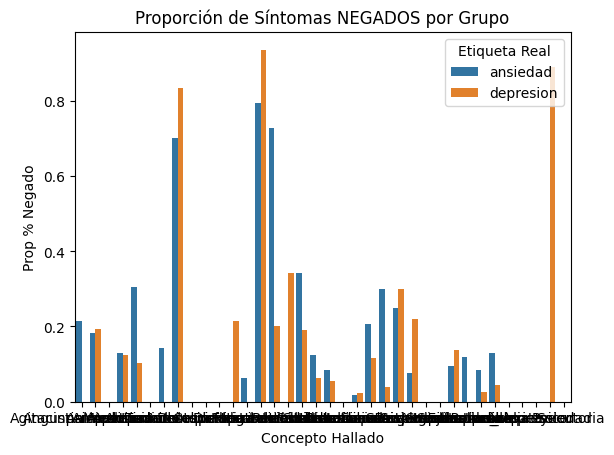

In [4]:
# ¿Cuántos síntomas de Ansiedad están negados en cada grupo?
neg_summary = df_ents.groupby(['target', 'concept'])['is_negated'].mean().reset_index()
neg_summary.columns = ['Etiqueta Real', 'Concepto Hallado', 'Prop % Negado']

sns.barplot(data=neg_summary, x='Concepto Hallado', y='Prop % Negado', hue='Etiqueta Real')
plt.title("Proporción de Síntomas NEGADOS por Grupo")
plt.show()

## 4) Análisis de Co-ocurrencia (Comorbilidad)

¿Hay muchos pacientes con etiqueta 'depresion' que mencionan síntomas de 'ansiedad' (aunque sea de forma afirmativa)?

Distribución de menciones positivas (no negadas) por documento:
concept     1   2   3   4   5  6  7  8  9
target                                   
ansiedad   72  40  18  12   4  1  1  1  1
depresion  58  45  36  19  11  6  3  2  1


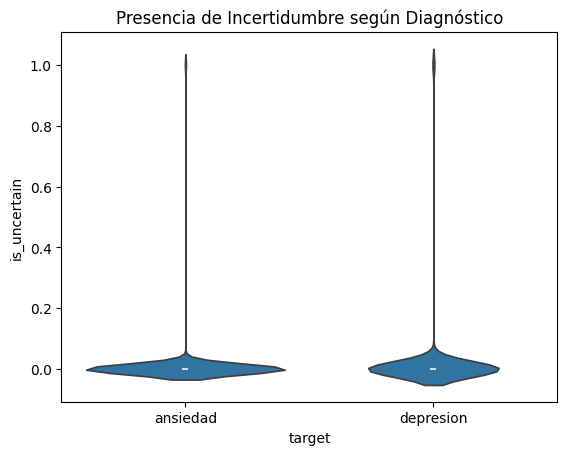

In [5]:
df_pos = df_ents[~df_ents['is_negated']]
overlap = df_pos.groupby(['row_id', 'target'])['concept'].nunique().reset_index()

print("Distribución de menciones positivas (no negadas) por documento:")
print(overlap.groupby('target')['concept'].value_counts().unstack())

sns.violinplot(data=df_ents, x='target', y='is_uncertain')
plt.title("Presencia de Incertidumbre según Diagnóstico")
plt.show()